In [1]:
import anndata as ad
import scanpy as sc
import gc
import sys
import cellanova as cnova
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sea

from metrics import calculate_metrics

R_HOME is already set to: /vast/palmer/apps/avx2/software/R/4.3.2-foss-2022b-patched/lib64/R


Unable to determine R library path: Command '('/vast/palmer/apps/avx2/software/R/4.3.2-foss-2022b-patched/lib64/R/bin/Rscript', '-e', 'cat(Sys.getenv("LD_LIBRARY_PATH"))')' returned non-zero exit status 127.


/gpfs/gibbs/project/wang_zuoheng/xx244/Ndreamer/case_control_benchmark/metrics.py:29: DeprecationWarning: The global conversion available with activate() is deprecated and will be removed in the next major release. Use a local converter.
  anndata2ri.activate()
/home/xx244/.conda/envs/benchmark/lib/python3.11/site-packages/rpy2/robjects/pandas2ri.py:368: DeprecationWarning: The global conversion available with activate() is deprecated and will be removed in the next major release. Use a local converter.
  warnings.warn('The global conversion available with activate() '
/home/xx244/.conda/envs/benchmark/lib/python3.11/site-packages/rpy2/robjects/numpy2ri.py:241: DeprecationWarning: The global conversion available with activate() is deprecated and will be removed in the next major release. Use a local converter.
  warnings.warn('The global conversion available with activate() '


In [2]:
def calculate_mean_proportion_matrix(df):
    """
    Calculates the mean proportion for each combination of condition and neighbor
    and summarizes the result in a square matrix dataframe.

    Parameters:
    df (pd.DataFrame): Input dataframe with columns ['condition', 'neighbor', 'proportion'].

    Returns:
    pd.DataFrame: A square matrix dataframe where rows represent 'condition' and columns represent 'neighbor'.
    """
    # Use a pivot table to calculate the mean proportions
    mean_matrix = df.pivot_table(
        index='condition',
        columns='neighbor',
        values='proportion',
        aggfunc='mean',
        fill_value=0  # Replace NaN with 0 if there are missing combinations
    )

    return mean_matrix

def calculate_rowwise_correlation(adata1, adata2, batch_key="batch_all_with_condition"):
    # Ensure the obs index and batch_key match
    #assert np.sum(adata1.obs["batch_all_with_condition"]!=adata2.obs["batch_all_with_condition"])==0, "obs indices do not match between the two AnnData objects"
    assert batch_key in adata1.obs.columns, f"{batch_key} not found in adata1.obs"
    assert batch_key in adata2.obs.columns, f"{batch_key} not found in adata2.obs"

    results = []

    # Iterate through unique batches
    unique_batches = adata1.obs[batch_key].unique()
    for batch in unique_batches:
        # Subset the data for the current batch
        batch_mask = adata1.obs[batch_key] == batch
        data1 = adata1[batch_mask].X
        data2 = adata2[batch_mask].X
        
        barcodes=adata1[batch_mask].obs_names.tolist()

        # Ensure the data is in dense format if sparse
        if not isinstance(data1, np.ndarray):
            data1 = data1.toarray()
        if not isinstance(data2, np.ndarray):
            data2 = data2.toarray()

        # Compute correlation for each row
        for i in range(data1.shape[0]):
            row_corr = np.corrcoef(data1[i, :], data2[i, :])[0, 1]
            mse=np.mean(np.square(data1[i, :]-data2[i, :]))
            results.append({"correlation": row_corr, batch_key: batch, "barcode":barcodes[i], "mse":mse})

    # Convert results to DataFrame
    result_df = pd.DataFrame(results)
    return result_df


def extract_de_results(adata, batch_key, cell_type_key, key_added="DE_wilcoxon", min_cells=30):
    results = []

    # Iterate through unique batches
    unique_batches = adata.obs[batch_key].unique()
    for batch in unique_batches:
        # Subset the AnnData for the current batch
        adata_batch = adata[adata.obs[batch_key] == batch]
        
        # Filter out cell types with fewer than `min_cells` cells
        cell_counts = adata_batch.obs[cell_type_key].value_counts()
        valid_cell_types = cell_counts[cell_counts >= min_cells].index
        
        # Subset the AnnData object to only include valid cell types
        adata_batch = adata_batch[adata_batch.obs[cell_type_key].isin(valid_cell_types)]
        
        # Skip the batch if there are no valid cell types
        if adata_batch.shape[0] == 0 or len(valid_cell_types) == 0:
            continue
        
        # Perform DE analysis
        sc.tl.rank_genes_groups(adata_batch, groupby=cell_type_key, method='wilcoxon', key_added=key_added, use_raw=False)
        
        # Extract DE results for each valid cell type
        for cell_type in valid_cell_types:
            # Extract adjusted p-values and gene names
            gene_names = adata_batch.uns[key_added]['names'][cell_type]
            pvals_adj = adata_batch.uns[key_added]['pvals_adj'][cell_type]
            
            # Create a dictionary for the current cell type and batch
            row_data = {
                "cell_type_key": cell_type,
                "batch_all_with_condition": batch,
            }
            # Add adjusted p-values for each gene as separate columns
            row_data.update({gene: pval for gene, pval in zip(gene_names, pvals_adj)})
            results.append(row_data)
    
    # Convert results to a DataFrame
    result_df = pd.DataFrame(results)
    return result_df

def evaluate_cellanova(adata, cell_type_key, batch_key, condition_key, dataset_name):
    adata.raw=None
    print("adata preprocessing...")

    import warnings
    warnings.filterwarnings("ignore")
    warnings.filterwarnings("ignore", category=FutureWarning)

    if isinstance(batch_key, str):
       batch_key = [batch_key]

    batch_all = []
    for i in range(adata.shape[0]):
        tmp = "__".join([adata.obs[batch_keyj][i] for batch_keyj in batch_key])
        batch_all.append(tmp)
    batch_all = np.array(batch_all)
    adata.obs["batch_all"]=batch_all
    adata.obs["batch_all"] = adata.obs["batch_all"].astype("category")
    print("batch_all", np.unique(batch_all))

    batch_all_with_condition = []
    for i in range(adata.shape[0]):
        tmp = "__".join([adata.obs[batch_keyj][i] for batch_keyj in batch_key])
        tmp = tmp + "__" + adata.obs[condition_key][i]
        batch_all_with_condition.append(tmp)
    batch_all_with_condition = np.array(batch_all_with_condition)
    adata.obs["batch_all_with_condition"] = batch_all_with_condition
    adata.obs["batch_all_with_condition"] = adata.obs["batch_all_with_condition"].astype("category")
    print("batch_all_with_condition", np.unique(batch_all_with_condition))

    batch_key.append("batch_all")
    batch_key.append("batch_all_with_condition")
    print("Finish preprocessing")

    main_effect_adata = ad.AnnData(adata.layers['main_effect'], dtype=np.float32)
    main_effect_adata.var_names = adata.var_names
    main_effect_adata.obs = adata.obs.copy()

    integrated = ad.AnnData(adata.layers['denoised'], dtype=np.float32)
    integrated.obs = adata.obs.copy()
    integrated.var_names = adata.var_names

    print("Calculating global distortion...")
    df_global_correlation=calculate_rowwise_correlation(adata, integrated)
    df_global_correlation.to_csv("./cellanova/"+dataset_name+"_global_correlation.csv")
    print("Finish")

    print("Evaluate gene-level signal distortion")
    if True:#dataset_name!="mouse":
        real_data_DE = extract_de_results(adata=adata, batch_key="batch_all_with_condition", cell_type_key=cell_type_key,key_added="DE_wilcoxon")
        denoised_DE = extract_de_results(adata=integrated, batch_key="batch_all_with_condition", cell_type_key=cell_type_key,key_added="DE_wilcoxon")
        real_data_DE.to_csv("./cellanova/"+dataset_name+"_real_DE.csv")
        denoised_DE.to_csv("./cellanova/"+dataset_name+"_denoised_DE.csv")
    print("Finish")

    print("Plot of main effect:")
    if main_effect_adata.shape[1] > 60:
        sc.pp.pca(main_effect_adata)
    sc.pp.neighbors(main_effect_adata, n_neighbors=15)
    sc.tl.umap(main_effect_adata)
    sc.pl.umap(main_effect_adata, color=[cell_type_key, condition_key] + batch_key, ncols=1)

    print("Plot of denoised expression")
    sc.pp.pca(integrated)
    sc.pp.neighbors(integrated, n_neighbors=15)
    sc.tl.umap(integrated)
    sc.pl.umap(integrated, color=[cell_type_key, condition_key] + batch_key, ncols=1)
    print("Finish adata preprocessing","="*20)
    
    print("Batch-related mixing performance evaluation for main effect:")
    for batch_keyi in batch_key:
        print("Batch-related mixing performance evaluation for main effect:")
        print(batch_keyi)
        import rpy2.robjects as robjects
        import anndata2ri
        anndata2ri.activate()
        # Add your library path
        library_path = "/gpfs/gibbs/project/wang_zuoheng/xx244/R/4.3/"  # Replace with the actual path
        # Update R's library paths
        robjects.r(f'.libPaths(c("{library_path}", .libPaths()))')
        # Verify the updated library paths
        print(robjects.r('.libPaths()'))
        calculate_metrics(main_effect_adata, batch_key=batch_keyi,
                          celltype_key=cell_type_key, all=True, n_neighbors=15)
        print("=" * 20)

    print("Batch effect:")
    print("condition-related mixing performance evaluation for main effect:")
    import rpy2.robjects as robjects
    import anndata2ri
    anndata2ri.activate()
    # Add your library path
    library_path = "/gpfs/gibbs/project/wang_zuoheng/xx244/R/4.3/"  # Replace with the actual path
    # Update R's library paths
    robjects.r(f'.libPaths(c("{library_path}", .libPaths()))')
    # Verify the updated library paths
    print(robjects.r('.libPaths()'))
    calculate_metrics(main_effect_adata, batch_key=condition_key,
                      celltype_key=cell_type_key, all=True, n_neighbors=15)
    print("="*20)

    print("Within each unique condition, evaluate the batch effect of the denoised data")
    unique_conditions=np.unique(np.array(integrated.obs[condition_key]))
    for conditioni in unique_conditions:
        print("Within each unique condition, evaluate the batch effect of the main effect")
        print("Now evaluating",conditioni)
        integratedi=integrated[integrated.obs[condition_key]==conditioni].copy()
        import rpy2.robjects as robjects
        import anndata2ri
        anndata2ri.activate()
        # Add your library path
        library_path = "/gpfs/gibbs/project/wang_zuoheng/xx244/R/4.3/"  # Replace with the actual path
        # Update R's library paths
        robjects.r(f'.libPaths(c("{library_path}", .libPaths()))')
        # Verify the updated library paths
        print(robjects.r('.libPaths()'))
        calculate_metrics(integratedi, batch_key="batch_all",
                          celltype_key=cell_type_key, all=True, n_neighbors=15)
        print("*"*20)
    
    res = cnova.utils.calc_oobNN(integrated, batch_key="batch_all_with_condition", condition_key=condition_key)
    df = res.obsm['knn_prop']
    df['condition'] = res.obs[condition_key]
    df.index.name = "index"

    df = df.reset_index()
    df = pd.melt(df, id_vars=['index', 'condition'], var_name='neighbor', value_name='proportion')
    df = df.rename(columns={'index': 'obs_name'})
    df.to_csv("./cellanova/" + dataset_name + "_oobNN.csv")

    g = sea.FacetGrid(df, col='neighbor', hue='condition')
    g.map(sea.kdeplot, 'proportion', bw_adjust=2, alpha=1)
    g.set(xlabel='NN proportion', ylabel='Density')
    g.add_legend()
    plt.suptitle('CellANOVA integration')
    sea.set_style('white')
    plt.show()

    df_summarize=calculate_mean_proportion_matrix(df)
    print(df_summarize)
    df_summarize.to_csv("./cellanova/"+dataset_name+"_summary.csv",index=False)

# Type 1 diabetes

https://www.ncbi.nlm.nih.gov/geo/query/acc.cgi?acc=GSE148073

adata preprocessing...


batch_all ['HPAP019' 'HPAP020' 'HPAP021' 'HPAP022' 'HPAP023' 'HPAP024' 'HPAP026'
 'HPAP028' 'HPAP029' 'HPAP032' 'HPAP034' 'HPAP035' 'HPAP036' 'HPAP037'
 'HPAP038' 'HPAP039' 'HPAP040' 'HPAP042' 'HPAP043' 'HPAP044' 'HPAP045'
 'HPAP047' 'HPAP049' 'HPAP050']


batch_all_with_condition ['HPAP019__AAB' 'HPAP020__T1D' 'HPAP021__T1D' 'HPAP022__Control'
 'HPAP023__T1D' 'HPAP024__AAB' 'HPAP026__Control' 'HPAP028__T1D'
 'HPAP029__AAB' 'HPAP032__T1D' 'HPAP034__Control' 'HPAP035__Control'
 'HPAP036__Control' 'HPAP037__Control' 'HPAP038__AAB' 'HPAP039__Control'
 'HPAP040__Control' 'HPAP042__Control' 'HPAP043__AAB' 'HPAP044__Control'
 'HPAP045__AAB' 'HPAP047__Control' 'HPAP049__AAB' 'HPAP050__AAB']
Finish preprocessing
Calculating global distortion...


Finish
Evaluate gene-level signal distortion


Finish
Plot of main effect:


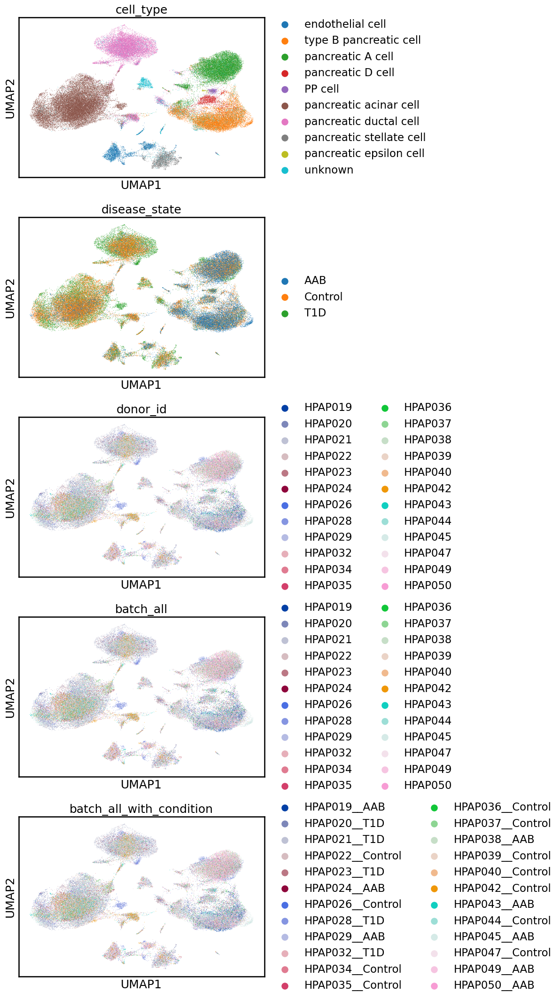

Plot of denoised expression


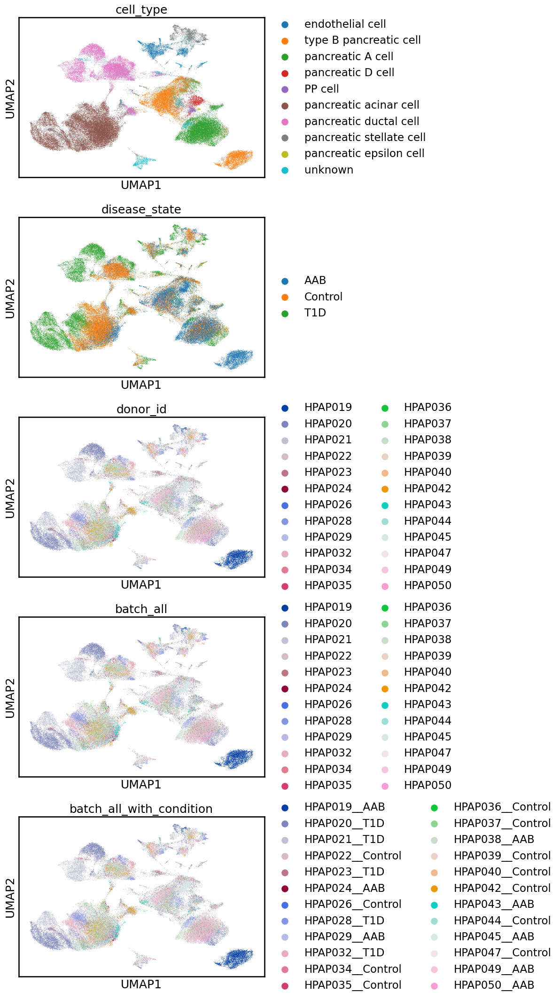

Finish adata preprocessing ====================
Batch-related mixing performance evaluation for main effect:
Batch-related mixing performance evaluation for main effect:
donor_id
['/gpfs/gibbs/project/wang_zuoheng/xx244/R/4.3'
 '/vast/palmer/apps/avx2/software/R/4.3.2-foss-2022b-patched/lib64/R/library']
LISI---


cLISI, bLISI, LISI_F1 0.9790263074727649 0.1180177373232277 0.21064326475485626


ASW---


asw_label 0.6471412926912308


asw_batch 0.8555745516220726


kBET---


0 labels consist of a single batch or is too small. Skip.
Adding diffusion to step 4
Adding diffusion to step 5


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 10


Adding diffusion to step 4


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


kbet_score 0.24500385115300505
graph_conn 0.8511346274174596


NMI, ARI ---
NMI 0.7353964776777927
ARI 0.8198680911051843
positive and true positive rate---


       ASW_label       ARI       NMI   1-cLISI     bLISI  ASW_batch  \
X_pca   0.647141  0.819868  0.735396  0.979026  0.118018   0.855575   

       kBET Accept Rate  graph connectivity  PCR_batch  pos rate  \
X_pca          0.245004            0.851135        0.0   0.89333   

       true pos rate   F1 LISI  
X_pca       0.036959  0.210643  
Batch-related mixing performance evaluation for main effect:
batch_all
['/gpfs/gibbs/project/wang_zuoheng/xx244/R/4.3'
 '/vast/palmer/apps/avx2/software/R/4.3.2-foss-2022b-patched/lib64/R/library']
LISI---


cLISI, bLISI, LISI_F1 0.9790263074727649 0.1180177373232277 0.21064326475485626


ASW---


asw_label 0.6471412926912308


asw_batch 0.8555745516220726


kBET---


0 labels consist of a single batch or is too small. Skip.
Adding diffusion to step 4
Adding diffusion to step 5


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 10


Adding diffusion to step 4


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


kbet_score 0.24440263740739443
graph_conn 0.8511346274174596


NMI, ARI ---
NMI 0.7353964776777927
ARI 0.8198680911051843
positive and true positive rate---


       ASW_label       ARI       NMI   1-cLISI     bLISI  ASW_batch  \
X_pca   0.647141  0.819868  0.735396  0.979026  0.118018   0.855575   

       kBET Accept Rate  graph connectivity  PCR_batch  pos rate  \
X_pca          0.244403            0.851135        0.0   0.89333   

       true pos rate   F1 LISI  
X_pca       0.036959  0.210643  
Batch-related mixing performance evaluation for main effect:
batch_all_with_condition
['/gpfs/gibbs/project/wang_zuoheng/xx244/R/4.3'
 '/vast/palmer/apps/avx2/software/R/4.3.2-foss-2022b-patched/lib64/R/library']
LISI---


cLISI, bLISI, LISI_F1 0.9790263074727649 0.1180177373232277 0.21064326475485626


ASW---


asw_label 0.6471412926912308


asw_batch 0.8555745516220726


kBET---


0 labels consist of a single batch or is too small. Skip.
Adding diffusion to step 4
Adding diffusion to step 5


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 10


Adding diffusion to step 4


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


kbet_score 0.24404846131466873
graph_conn 0.8511346274174596


NMI, ARI ---
NMI 0.7353964776777927
ARI 0.8198680911051843
positive and true positive rate---


       ASW_label       ARI       NMI   1-cLISI     bLISI  ASW_batch  \
X_pca   0.647141  0.819868  0.735396  0.979026  0.118018   0.855575   

       kBET Accept Rate  graph connectivity  PCR_batch  pos rate  \
X_pca          0.244048            0.851135        0.0   0.89333   

       true pos rate   F1 LISI  
X_pca       0.036959  0.210643  
Batch effect:
condition-related mixing performance evaluation for main effect:
['/gpfs/gibbs/project/wang_zuoheng/xx244/R/4.3'
 '/vast/palmer/apps/avx2/software/R/4.3.2-foss-2022b-patched/lib64/R/library']
LISI---


cLISI, bLISI, LISI_F1 0.9790263074727649 0.39899425535708366 0.5669376539968565


ASW---


asw_label 0.6471412926912308


asw_batch 0.9027015533934175


kBET---


0 labels consist of a single batch or is too small. Skip.
Adding diffusion to step 4
Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 4


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 10


Adding diffusion to step 4


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


kbet_score 0.30277557095658447
graph_conn 0.8511346274174596


NMI, ARI ---
NMI 0.7353964776777927
ARI 0.8198680911051843
positive and true positive rate---


       ASW_label       ARI       NMI   1-cLISI     bLISI  ASW_batch  \
X_pca   0.647141  0.819868  0.735396  0.979026  0.398994   0.902702   

       kBET Accept Rate  graph connectivity  PCR_batch  pos rate  \
X_pca          0.302776            0.851135        0.0   0.89333   

       true pos rate   F1 LISI  
X_pca       0.258396  0.566938  
Within each unique condition, evaluate the batch effect of the denoised data
Within each unique condition, evaluate the batch effect of the main effect
Now evaluating AAB
['/gpfs/gibbs/project/wang_zuoheng/xx244/R/4.3'
 '/vast/palmer/apps/avx2/software/R/4.3.2-foss-2022b-patched/lib64/R/library']


LISI---


cLISI, bLISI, LISI_F1 0.9722221617188144 0.11713615527445304 0.20908155621501215


ASW---


asw_label 0.6083260402083397


asw_batch 0.8807701916628975


kBET---


0 labels consist of a single batch or is too small. Skip.
Adding diffusion to step 4


Adding diffusion to step 4
Adding diffusion to step 5


Adding diffusion to step 4


Adding diffusion to step 4


Adding diffusion to step 4
Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 4


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 4


Adding diffusion to step 5


kbet_score 0.2554887735723764
graph_conn 0.9180635088055723


NMI, ARI ---
NMI 0.6425452469121519
ARI 0.560520948749695
positive and true positive rate---


       ASW_label       ARI       NMI   1-cLISI     bLISI  ASW_batch  \
X_pca   0.608326  0.560521  0.642545  0.972222  0.117136    0.88077   

       kBET Accept Rate  graph connectivity  PCR_batch  pos rate  \
X_pca          0.255489            0.918064        0.0  0.877924   

       true pos rate   F1 LISI  
X_pca        0.03196  0.209082  
********************
Within each unique condition, evaluate the batch effect of the main effect
Now evaluating Control


['/gpfs/gibbs/project/wang_zuoheng/xx244/R/4.3'
 '/vast/palmer/apps/avx2/software/R/4.3.2-foss-2022b-patched/lib64/R/library']
LISI---


cLISI, bLISI, LISI_F1 0.9852359075143887 0.1909415561991133 0.31988791352980156


ASW---


asw_label 0.6748209595680237


asw_batch 0.8838545616089368


kBET---


0 labels consist of a single batch or is too small. Skip.


Adding diffusion to step 4


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 4


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 4


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 4
Adding diffusion to step 5
Adding diffusion to step 6
Adding diffusion to step 7


kbet_score 0.3821368773424578
graph_conn 0.8677954335807536


NMI, ARI ---
NMI 0.7784413820263594
ARI 0.8696565958854446
positive and true positive rate---


       ASW_label       ARI       NMI   1-cLISI     bLISI  ASW_batch  \
X_pca   0.674821  0.869657  0.778441  0.985236  0.190942   0.883855   

       kBET Accept Rate  graph connectivity  PCR_batch  pos rate  \
X_pca          0.382137            0.867795        0.0  0.927991   

       true pos rate   F1 LISI  
X_pca       0.112507  0.319888  
********************
Within each unique condition, evaluate the batch effect of the main effect
Now evaluating T1D
['/gpfs/gibbs/project/wang_zuoheng/xx244/R/4.3'
 '/vast/palmer/apps/avx2/software/R/4.3.2-foss-2022b-patched/lib64/R/library']


LISI---


cLISI, bLISI, LISI_F1 0.9819650987652946 0.059003950847829875 0.11131900692602753


ASW---


asw_label 0.6298771649599075


asw_batch 0.8507326943045319


kBET---


0 labels consist of a single batch or is too small. Skip.
Adding diffusion to step 4
Adding diffusion to step 5


Adding diffusion to step 4
Adding diffusion to step 5


Adding diffusion to step 6
Adding diffusion to step 7


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 4


Adding diffusion to step 4
Adding diffusion to step 5


Adding diffusion to step 4
Adding diffusion to step 5
Adding diffusion to step 6


Adding diffusion to step 7
Adding diffusion to step 8


Adding diffusion to step 9


kbet_score 0.12019974445266901
graph_conn 0.9265850469052459


NMI, ARI ---
NMI 0.6476247561695601
ARI 0.5365634103318266
positive and true positive rate---


       ASW_label       ARI       NMI   1-cLISI     bLISI  ASW_batch  \
X_pca   0.629877  0.536563  0.647625  0.981965  0.059004   0.850733   

       kBET Accept Rate  graph connectivity  PCR_batch  pos rate  \
X_pca            0.1202            0.926585        0.0  0.916786   

       true pos rate   F1 LISI  
X_pca       0.014107  0.111319  
********************


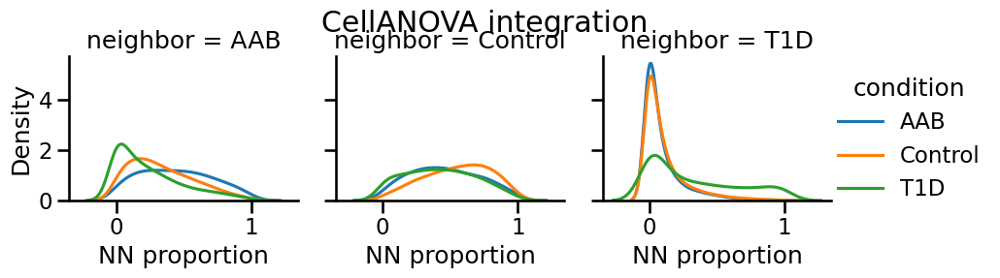

neighbor        AAB   Control       T1D
condition                              
AAB        0.443524  0.461984  0.094492
Control    0.338516  0.552509  0.108975
T1D        0.243367  0.425788  0.330845


In [3]:
adata=sc.read_h5ad("./cellanova/t1d_results.h5ad")
evaluate_cellanova(adata=adata,cell_type_key="cell_type",batch_key="donor_id",
                   condition_key="disease_state",dataset_name="t1d")

# Human kidney multiomics atlas

https://www.ncbi.nlm.nih.gov/geo/query/acc.cgi?acc=GSE211785

adata preprocessing...


batch_all ['HK1584__SC_RNA' 'HK1585__SC_RNA' 'HK1588__SC_RNA' 'HK1593__SC_RNA'
 'HK1594__SC_RNA' 'HK1597__SC_RNA' 'HK1632__SC_RNA' 'HK1634__SC_RNA'
 'HK1635__SC_RNA' 'HK1650__SC_RNA' 'HK1664__SC_RNA' 'HK1770__SC_RNA'
 'HK1997__SC_RNA' 'HK2558__SN_RNA' 'HK2596__SN_RNA' 'HK2662__SC_RNA'
 'HK2663__SN_RNA' 'HK2711__SN_RNA' 'HK2713__SC_RNA' 'HK2739__SN_RNA'
 'HK2770__SC_RNA' 'HK2770__SN_RNA' 'HK2774__SC_RNA' 'HK2774__SN_RNA'
 'HK2833__SC_RNA' 'HK2833__SN_RNA' 'HK2844__SN_RNA' 'HK2862__SN_RNA'
 'HK2867__SC_RNA' 'HK2867__SN_RNA' 'HK2868__SN_RNA' 'HK2891__SC_RNA'
 'HK2891__SN_RNA' 'HK2893__SC_RNA' 'HK2893__SN_RNA' 'HK2895__SC_RNA'
 'HK2895__SN_RNA' 'HK2896__SC_RNA' 'HK2898__SN_RNA' 'HK2899__SC_RNA'
 'HK2899__SN_RNA' 'HK2923__SC_RNA' 'HK2924__SC_RNA' 'HK2976__SN_RNA']


batch_all_with_condition ['HK1584__SC_RNA__Disease' 'HK1585__SC_RNA__Control'
 'HK1588__SC_RNA__Control' 'HK1593__SC_RNA__Disease'
 'HK1594__SC_RNA__Disease' 'HK1597__SC_RNA__Disease'
 'HK1632__SC_RNA__Disease' 'HK1634__SC_RNA__Disease'
 'HK1635__SC_RNA__Disease' 'HK1650__SC_RNA__Disease'
 'HK1664__SC_RNA__Control' 'HK1770__SC_RNA__Disease'
 'HK1997__SC_RNA__Control' 'HK2558__SN_RNA__Disease'
 'HK2596__SN_RNA__Disease' 'HK2662__SC_RNA__Control'
 'HK2663__SN_RNA__Disease' 'HK2711__SN_RNA__Disease'
 'HK2713__SC_RNA__Control' 'HK2739__SN_RNA__Disease'
 'HK2770__SC_RNA__Disease' 'HK2770__SN_RNA__Control'
 'HK2774__SC_RNA__Disease' 'HK2774__SN_RNA__Disease'
 'HK2833__SC_RNA__Control' 'HK2833__SN_RNA__Control'
 'HK2844__SN_RNA__Disease' 'HK2862__SN_RNA__Disease'
 'HK2867__SC_RNA__Control' 'HK2867__SN_RNA__Control'
 'HK2868__SN_RNA__Disease' 'HK2891__SC_RNA__Control'
 'HK2891__SN_RNA__Control' 'HK2893__SC_RNA__Control'
 'HK2893__SN_RNA__Control' 'HK2895__SC_RNA__Control'
 'HK2895__SN_RNA__Con

Finish
Evaluate gene-level signal distortion


Finish
Plot of main effect:


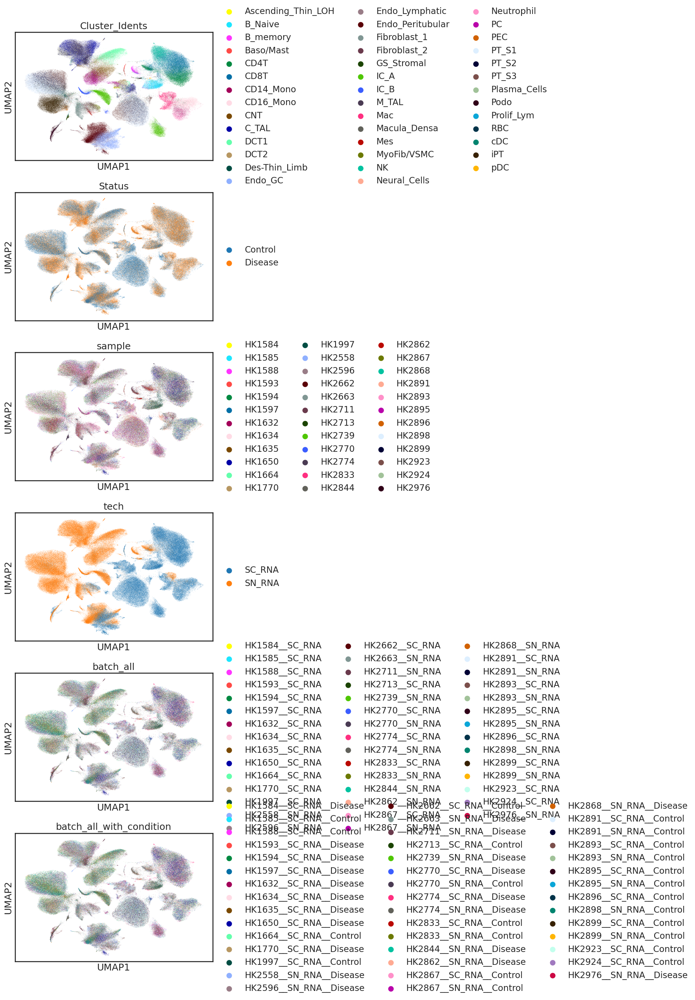

Plot of denoised expression


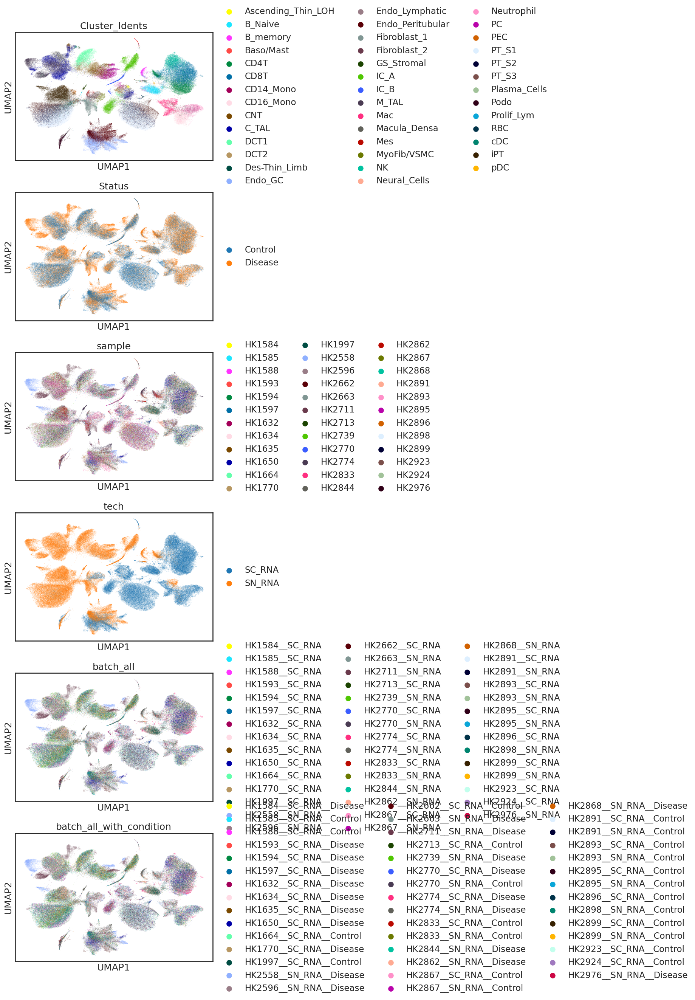

Finish adata preprocessing ====================
Batch-related mixing performance evaluation for main effect:
Batch-related mixing performance evaluation for main effect:
sample
['/gpfs/gibbs/project/wang_zuoheng/xx244/R/4.3'
 '/vast/palmer/apps/avx2/software/R/4.3.2-foss-2022b-patched/lib64/R/library']


LISI---


cLISI, bLISI, LISI_F1 0.9867236355844601 0.08320384518957467 0.15346685096950566


ASW---


asw_label 0.5307410955429077


asw_batch 0.8213267928829433


kBET---


0 labels consist of a single batch or is too small. Skip.
Adding diffusion to step 4
Adding diffusion to step 5


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 10


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 10


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 4
Adding diffusion to step 5


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 4


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 4


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 4


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 4
Adding diffusion to step 5


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 10


Adding diffusion to step 11


kbet_score 0.3858614636746768


graph_conn 0.9012020843728967


NMI, ARI ---


NMI 0.712016235256161
ARI 0.48520404825236113
positive and true positive rate---


       ASW_label       ARI       NMI   1-cLISI     bLISI  ASW_batch  \
X_pca   0.530741  0.485204  0.712016  0.986724  0.083204   0.821327   

       kBET Accept Rate  graph connectivity  PCR_batch  pos rate  \
X_pca          0.385861            0.901202        0.0  0.745943   

       true pos rate   F1 LISI  
X_pca       0.036669  0.153467  
Batch-related mixing performance evaluation for main effect:
tech
['/gpfs/gibbs/project/wang_zuoheng/xx244/R/4.3'
 '/vast/palmer/apps/avx2/software/R/4.3.2-foss-2022b-patched/lib64/R/library']


Cell cluster Baso/Mast contains only one batch or has less than 10 cells. Skip.
LISI---


cLISI, bLISI, LISI_F1 0.9867236355844601 0.0886083557254872 0.1626138896846285


ASW---


asw_label 0.5307410955429077


asw_batch 0.65473342746704


kBET---


1 labels consist of a single batch or is too small. Skip.
Adding diffusion to step 4
Adding diffusion to step 5
Adding diffusion to step 6


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 4


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 10


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 10


Adding diffusion to step 11


Adding diffusion to step 12


Adding diffusion to step 13


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 4
Adding diffusion to step 5
Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 4


Adding diffusion to step 4
Adding diffusion to step 5


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 4


Adding diffusion to step 4


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 4
Adding diffusion to step 5
Adding diffusion to step 6
Adding diffusion to step 7


Adding diffusion to step 4


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 10


Adding diffusion to step 11


kbet_score 0.40406240014263417


graph_conn 0.9012020843728967


NMI, ARI ---


NMI 0.712016235256161
ARI 0.48520404825236113
positive and true positive rate---


       ASW_label       ARI       NMI   1-cLISI     bLISI  ASW_batch  \
X_pca   0.530741  0.485204  0.712016  0.986724  0.088608   0.654733   

       kBET Accept Rate  graph connectivity  PCR_batch  pos rate  \
X_pca          0.404062            0.901202        0.0  0.745943   

       true pos rate   F1 LISI  
X_pca       0.324334  0.162614  
Batch-related mixing performance evaluation for main effect:
batch_all
['/gpfs/gibbs/project/wang_zuoheng/xx244/R/4.3'
 '/vast/palmer/apps/avx2/software/R/4.3.2-foss-2022b-patched/lib64/R/library']


LISI---


cLISI, bLISI, LISI_F1 0.9867236355844601 0.06898672682754056 0.12895740408727288


ASW---


asw_label 0.5307410955429077


asw_batch 0.8360934492322347


kBET---


0 labels consist of a single batch or is too small. Skip.
Adding diffusion to step 4
Adding diffusion to step 5


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 4
Adding diffusion to step 5


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 4


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 4


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 4


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 4
Adding diffusion to step 5


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 10


Adding diffusion to step 11


kbet_score 0.42348220314332863


graph_conn 0.9012020843728967


NMI, ARI ---


NMI 0.712016235256161
ARI 0.48520404825236113
positive and true positive rate---


       ASW_label       ARI       NMI   1-cLISI     bLISI  ASW_batch  \
X_pca   0.530741  0.485204  0.712016  0.986724  0.068987   0.836093   

       kBET Accept Rate  graph connectivity  PCR_batch  pos rate  \
X_pca          0.423482            0.901202        0.0  0.745943   

       true pos rate   F1 LISI  
X_pca       0.032225  0.128957  
Batch-related mixing performance evaluation for main effect:
batch_all_with_condition
['/gpfs/gibbs/project/wang_zuoheng/xx244/R/4.3'
 '/vast/palmer/apps/avx2/software/R/4.3.2-foss-2022b-patched/lib64/R/library']


LISI---


cLISI, bLISI, LISI_F1 0.9867236355844601 0.06898672682754056 0.12895740408727288


ASW---


asw_label 0.5307410955429077


asw_batch 0.8360934492322347


kBET---


0 labels consist of a single batch or is too small. Skip.
Adding diffusion to step 4
Adding diffusion to step 5


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 4
Adding diffusion to step 5


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 4


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 4


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 4


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 4
Adding diffusion to step 5


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 10


Adding diffusion to step 11


kbet_score 0.42292568614713777


graph_conn 0.9012020843728967


NMI, ARI ---


NMI 0.712016235256161
ARI 0.48520404825236113
positive and true positive rate---


       ASW_label       ARI       NMI   1-cLISI     bLISI  ASW_batch  \
X_pca   0.530741  0.485204  0.712016  0.986724  0.068987   0.836093   

       kBET Accept Rate  graph connectivity  PCR_batch  pos rate  \
X_pca          0.422926            0.901202        0.0  0.745943   

       true pos rate   F1 LISI  
X_pca       0.032225  0.128957  
Batch effect:
condition-related mixing performance evaluation for main effect:
['/gpfs/gibbs/project/wang_zuoheng/xx244/R/4.3'
 '/vast/palmer/apps/avx2/software/R/4.3.2-foss-2022b-patched/lib64/R/library']


LISI---


cLISI, bLISI, LISI_F1 0.9867236355844601 0.5420233204484124 0.699693587894108


ASW---


asw_label 0.5307410955429077


asw_batch 0.9042200460999485


kBET---


0 labels consist of a single batch or is too small. Skip.
Adding diffusion to step 4
Adding diffusion to step 5
Adding diffusion to step 6


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 4


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 10


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 10


Adding diffusion to step 11


Adding diffusion to step 12


Adding diffusion to step 13


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 4
Adding diffusion to step 5
Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 4


Adding diffusion to step 4
Adding diffusion to step 5


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 4


Adding diffusion to step 4


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 4
Adding diffusion to step 5
Adding diffusion to step 6
Adding diffusion to step 7


Adding diffusion to step 4


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 10


Adding diffusion to step 11


kbet_score 0.49410823999495057


graph_conn 0.9012020843728967


NMI, ARI ---


NMI 0.712016235256161
ARI 0.48520404825236113
positive and true positive rate---


       ASW_label       ARI       NMI   1-cLISI     bLISI  ASW_batch  \
X_pca   0.530741  0.485204  0.712016  0.986724  0.542023    0.90422   

       kBET Accept Rate  graph connectivity  PCR_batch  pos rate  \
X_pca          0.494108            0.901202        0.0  0.745943   

       true pos rate   F1 LISI  
X_pca       0.455147  0.699694  
Within each unique condition, evaluate the batch effect of the denoised data
Within each unique condition, evaluate the batch effect of the main effect
Now evaluating Control


['/gpfs/gibbs/project/wang_zuoheng/xx244/R/4.3'
 '/vast/palmer/apps/avx2/software/R/4.3.2-foss-2022b-patched/lib64/R/library']


LISI---


cLISI, bLISI, LISI_F1 0.9862506008698855 0.09687048245548074 0.17641346475308908


ASW---


asw_label 0.5316788293421268


asw_batch 0.8631866544015774


kBET---


0 labels consist of a single batch or is too small. Skip.
Adding diffusion to step 4


Adding diffusion to step 4


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 4


Adding diffusion to step 4
Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 4


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 4
Adding diffusion to step 5


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 10


Adding diffusion to step 11


Adding diffusion to step 4
Adding diffusion to step 5


Adding diffusion to step 4


Adding diffusion to step 4


Adding diffusion to step 4


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


kbet_score 0.43248793775318817


graph_conn 0.8573773058412125


NMI, ARI ---
NMI 0.6963667817641511
ARI 0.42535844475482376
positive and true positive rate---


       ASW_label       ARI       NMI   1-cLISI    bLISI  ASW_batch  \
X_pca   0.531679  0.425358  0.696367  0.986251  0.09687   0.863187   

       kBET Accept Rate  graph connectivity  PCR_batch  pos rate  \
X_pca          0.432488            0.857377        0.0  0.746395   

       true pos rate   F1 LISI  
X_pca       0.069557  0.176413  
********************
Within each unique condition, evaluate the batch effect of the main effect
Now evaluating Disease


['/gpfs/gibbs/project/wang_zuoheng/xx244/R/4.3'
 '/vast/palmer/apps/avx2/software/R/4.3.2-foss-2022b-patched/lib64/R/library']


LISI---


cLISI, bLISI, LISI_F1 0.9890412270641199 0.06764849395877517 0.1266353748747728


ASW---


asw_label 0.5372824966907501


asw_batch 0.8797345069871072


kBET---


0 labels consist of a single batch or is too small. Skip.
Adding diffusion to step 4


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 4


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 4


Adding diffusion to step 4


Adding diffusion to step 4
Adding diffusion to step 5
Adding diffusion to step 6
Adding diffusion to step 7


Adding diffusion to step 4


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 4


Adding diffusion to step 4
Adding diffusion to step 5
Adding diffusion to step 6


Adding diffusion to step 4


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 4


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 4
Adding diffusion to step 5
Adding diffusion to step 6
Adding diffusion to step 7


Adding diffusion to step 4


Adding diffusion to step 4


Adding diffusion to step 4
Adding diffusion to step 5


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 4
Adding diffusion to step 5


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


kbet_score 0.33112212317413225


graph_conn 0.9001131497090142


NMI, ARI ---


NMI 0.7204217993462029
ARI 0.5072100363901482
positive and true positive rate---


       ASW_label      ARI       NMI   1-cLISI     bLISI  ASW_batch  \
X_pca   0.537282  0.50721  0.720422  0.989041  0.067648   0.879735   

       kBET Accept Rate  graph connectivity  PCR_batch  pos rate  \
X_pca          0.331122            0.900113        0.0  0.792516   

       true pos rate   F1 LISI  
X_pca       0.020825  0.126635  
********************


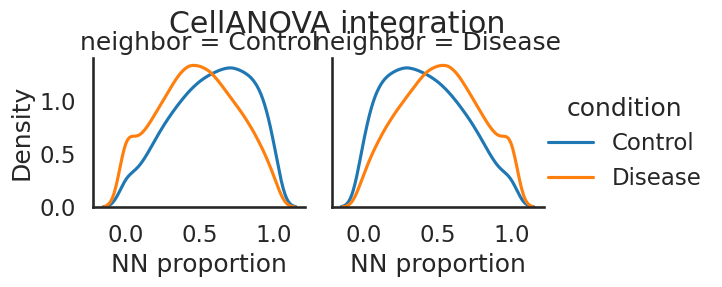

neighbor    Control   Disease
condition                    
Control    0.579030  0.420970
Disease    0.479549  0.520451


In [4]:
adata=sc.read_h5ad("./cellanova/kidney_results.h5ad")
evaluate_cellanova(adata=adata,cell_type_key='Cluster_Idents',batch_key=['sample','tech'],
                   condition_key="Status",dataset_name="kidney")

# Mouse radiation experiment dataset

https://www.ncbi.nlm.nih.gov/geo/query/acc.cgi?acc=GSE280883

adata preprocessing...


batch_all ['D10__1.0__CY' 'D10__1.0__LL' 'D20__1.0__CY' 'D2__1.0__CY' 'D2__2.0__CY'
 'D3.5__1.0__LL' 'D3.5__2.0__LL' 'D3.5__3.0__LL' 'D3.5__4.0__LL']


batch_all_with_condition ['D10__1.0__CY__C' 'D10__1.0__CY__SR' 'D10__1.0__LL__SR' 'D20__1.0__CY__C'
 'D20__1.0__CY__SR' 'D2__1.0__CY__C' 'D2__1.0__CY__SR' 'D2__2.0__CY__SR'
 'D3.5__1.0__LL__C' 'D3.5__1.0__LL__SR' 'D3.5__2.0__LL__C'
 'D3.5__2.0__LL__SR' 'D3.5__3.0__LL__SR' 'D3.5__4.0__LL__SR']
Finish preprocessing


Calculating global distortion...


Finish
Evaluate gene-level signal distortion


Finish
Plot of main effect:


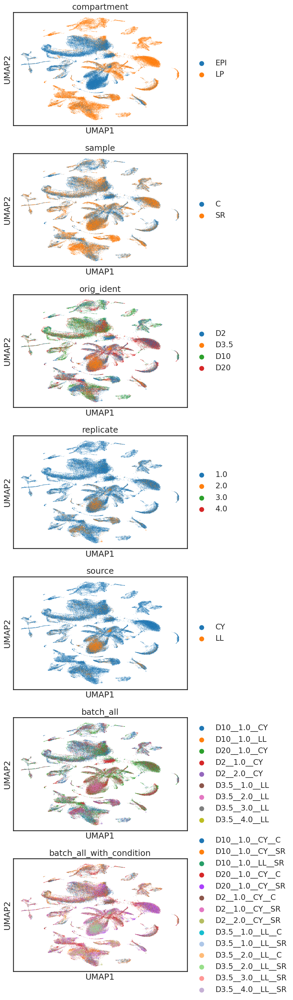

Plot of denoised expression


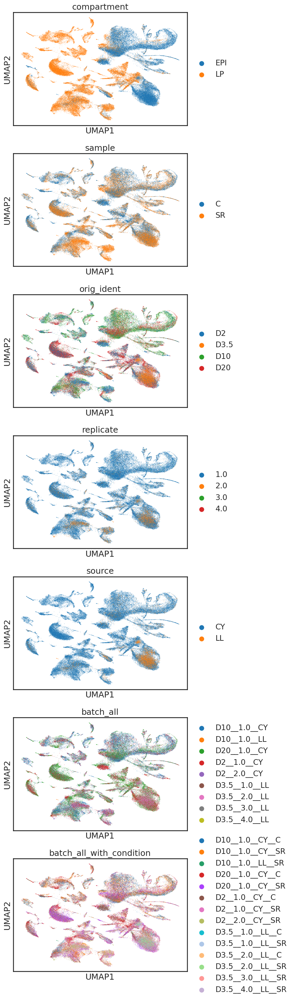

Finish adata preprocessing ====================
Batch-related mixing performance evaluation for main effect:
Batch-related mixing performance evaluation for main effect:
orig_ident
['/gpfs/gibbs/project/wang_zuoheng/xx244/R/4.3'
 '/vast/palmer/apps/avx2/software/R/4.3.2-foss-2022b-patched/lib64/R/library']
LISI---


cLISI, bLISI, LISI_F1 0.8897787594942681 0.3440626318777689 0.496238210067026


ASW---


asw_label 0.5367188043892384


asw_batch 0.8460694353372724


kBET---


0 labels consist of a single batch or is too small. Skip.


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 10


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


kbet_score 0.04907708510679465
graph_conn 0.9935848339571163


NMI, ARI ---
NMI 0.2673901627380518
ARI 0.13171397883534508
positive and true positive rate---


       ASW_label       ARI      NMI   1-cLISI     bLISI  ASW_batch  \
X_pca   0.536719  0.131714  0.26739  0.889779  0.344063   0.846069   

       kBET Accept Rate  graph connectivity  PCR_batch  pos rate  \
X_pca          0.049077            0.993585        0.0  0.951549   

       true pos rate   F1 LISI  
X_pca       0.088697  0.496238  
Batch-related mixing performance evaluation for main effect:
replicate
['/gpfs/gibbs/project/wang_zuoheng/xx244/R/4.3'
 '/vast/palmer/apps/avx2/software/R/4.3.2-foss-2022b-patched/lib64/R/library']
LISI---


cLISI, bLISI, LISI_F1 0.8897787594942681 0.1082109456981977 0.19295549949280347


ASW---


asw_label 0.5367188043892384


asw_batch 0.8761821671383208


kBET---


0 labels consist of a single batch or is too small. Skip.


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 10


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


kbet_score 0.6779150528169013
graph_conn 0.9935848339571163


NMI, ARI ---
NMI 0.2673901627380518
ARI 0.13171397883534508
positive and true positive rate---


       ASW_label       ARI      NMI   1-cLISI     bLISI  ASW_batch  \
X_pca   0.536719  0.131714  0.26739  0.889779  0.108211   0.876182   

       kBET Accept Rate  graph connectivity  PCR_batch  pos rate  \
X_pca          0.677915            0.993585        0.0  0.951549   

       true pos rate   F1 LISI  
X_pca       0.771558  0.192955  
Batch-related mixing performance evaluation for main effect:
source
['/gpfs/gibbs/project/wang_zuoheng/xx244/R/4.3'
 '/vast/palmer/apps/avx2/software/R/4.3.2-foss-2022b-patched/lib64/R/library']
Cell cluster LP contains only one batch or has less than 10 cells. Skip.
LISI---


cLISI, bLISI, LISI_F1 0.8897787594942681 0.28319013176349506 0.4296389546552235


ASW---


asw_label 0.5367188043892384


asw_batch 0.8442041940002039


kBET---


1 labels consist of a single batch or is too small. Skip.


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 10


kbet_score 0.3765600961538461
graph_conn 0.9935848339571163


NMI, ARI ---
NMI 0.2673901627380518
ARI 0.13171397883534508
positive and true positive rate---


       ASW_label       ARI      NMI   1-cLISI    bLISI  ASW_batch  \
X_pca   0.536719  0.131714  0.26739  0.889779  0.28319   0.844204   

       kBET Accept Rate  graph connectivity  PCR_batch  pos rate  \
X_pca           0.37656            0.993585        0.0  0.951549   

       true pos rate   F1 LISI  
X_pca       0.777243  0.429639  
Batch-related mixing performance evaluation for main effect:
batch_all
['/gpfs/gibbs/project/wang_zuoheng/xx244/R/4.3'
 '/vast/palmer/apps/avx2/software/R/4.3.2-foss-2022b-patched/lib64/R/library']
LISI---


cLISI, bLISI, LISI_F1 0.8897787594942681 0.23461107401019618 0.37131596920576654


ASW---


asw_label 0.5367188043892384


asw_batch 0.8425726777759637


kBET---


0 labels consist of a single batch or is too small. Skip.


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 10


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


kbet_score 0.045606267412165336
graph_conn 0.9935848339571163


NMI, ARI ---
NMI 0.2673901627380518
ARI 0.13171397883534508
positive and true positive rate---


       ASW_label       ARI      NMI   1-cLISI     bLISI  ASW_batch  \
X_pca   0.536719  0.131714  0.26739  0.889779  0.234611   0.842573   

       kBET Accept Rate  graph connectivity  PCR_batch  pos rate  \
X_pca          0.045606            0.993585        0.0  0.951549   

       true pos rate   F1 LISI  
X_pca       0.085148  0.371316  
Batch-related mixing performance evaluation for main effect:
batch_all_with_condition
['/gpfs/gibbs/project/wang_zuoheng/xx244/R/4.3'
 '/vast/palmer/apps/avx2/software/R/4.3.2-foss-2022b-patched/lib64/R/library']
LISI---


cLISI, bLISI, LISI_F1 0.8897787594942681 0.21316552366315092 0.3439342460146259


ASW---


asw_label 0.5367188043892384


asw_batch 0.8563070170285297


kBET---


0 labels consist of a single batch or is too small. Skip.


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 10


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


kbet_score 0.009601399260950272
graph_conn 0.9935848339571163


NMI, ARI ---
NMI 0.2673901627380518
ARI 0.13171397883534508
positive and true positive rate---


       ASW_label       ARI      NMI   1-cLISI     bLISI  ASW_batch  \
X_pca   0.536719  0.131714  0.26739  0.889779  0.213166   0.856307   

       kBET Accept Rate  graph connectivity  PCR_batch  pos rate  \
X_pca          0.009601            0.993585        0.0  0.951549   

       true pos rate   F1 LISI  
X_pca       0.018776  0.343934  
Batch effect:
condition-related mixing performance evaluation for main effect:
['/gpfs/gibbs/project/wang_zuoheng/xx244/R/4.3'
 '/vast/palmer/apps/avx2/software/R/4.3.2-foss-2022b-patched/lib64/R/library']
LISI---


cLISI, bLISI, LISI_F1 0.8897787594942681 0.5472096846194829 0.6776610575518739


ASW---


asw_label 0.5367188043892384


asw_batch 0.9112324631090801


kBET---


0 labels consist of a single batch or is too small. Skip.


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 10


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


kbet_score 0.3209143974423464
graph_conn 0.9935848339571163


NMI, ARI ---
NMI 0.2673901627380518
ARI 0.13171397883534508
positive and true positive rate---


       ASW_label       ARI      NMI   1-cLISI    bLISI  ASW_batch  \
X_pca   0.536719  0.131714  0.26739  0.889779  0.54721   0.911232   

       kBET Accept Rate  graph connectivity  PCR_batch  pos rate  \
X_pca          0.320914            0.993585        0.0  0.951549   

       true pos rate   F1 LISI  
X_pca        0.39933  0.677661  
Within each unique condition, evaluate the batch effect of the denoised data
Within each unique condition, evaluate the batch effect of the main effect
Now evaluating C


['/gpfs/gibbs/project/wang_zuoheng/xx244/R/4.3'
 '/vast/palmer/apps/avx2/software/R/4.3.2-foss-2022b-patched/lib64/R/library']
LISI---


cLISI, bLISI, LISI_F1 0.9426213406880075 0.2765138747423609 0.42759470160406843


ASW---


asw_label 0.5448505021631718


asw_batch 0.8533385114802629


kBET---


0 labels consist of a single batch or is too small. Skip.


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


kbet_score 0.08343950084834639
graph_conn 0.9948462927128439


NMI, ARI ---
NMI 0.3120076233198309
ARI 0.15649922191130783
positive and true positive rate---


       ASW_label       ARI       NMI   1-cLISI     bLISI  ASW_batch  \
X_pca   0.544851  0.156499  0.312008  0.942621  0.276514   0.853339   

       kBET Accept Rate  graph connectivity  PCR_batch  pos rate  \
X_pca           0.08344            0.994846        0.0  0.973947   

       true pos rate   F1 LISI  
X_pca       0.114061  0.427595  
********************
Within each unique condition, evaluate the batch effect of the main effect
Now evaluating SR


['/gpfs/gibbs/project/wang_zuoheng/xx244/R/4.3'
 '/vast/palmer/apps/avx2/software/R/4.3.2-foss-2022b-patched/lib64/R/library']
LISI---


cLISI, bLISI, LISI_F1 0.8613099054992244 0.24672601749548434 0.3835752224330192


ASW---


asw_label 0.5426000282168388


asw_batch 0.8409636667650495


kBET---


0 labels consist of a single batch or is too small. Skip.


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 10


kbet_score 0.020349516509218013
graph_conn 0.9914061726788101


NMI, ARI ---
NMI 0.25372419944738156
ARI 0.13940792941015828
positive and true positive rate---


       ASW_label       ARI       NMI  1-cLISI     bLISI  ASW_batch  \
X_pca     0.5426  0.139408  0.253724  0.86131  0.246726   0.840964   

       kBET Accept Rate  graph connectivity  PCR_batch  pos rate  \
X_pca           0.02035            0.991406        0.0  0.941286   

       true pos rate   F1 LISI  
X_pca       0.033043  0.383575  
********************


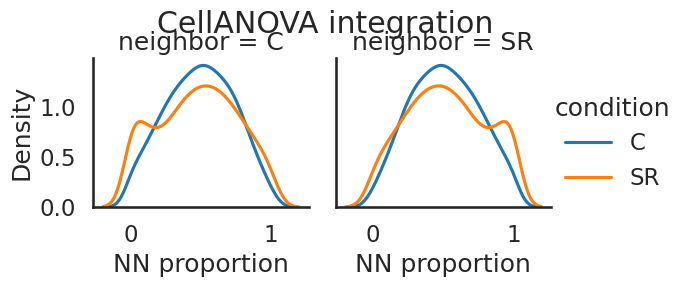

neighbor          C        SR
condition                    
C          0.489302  0.510698
SR         0.474340  0.525660


In [5]:
adata=sc.read_h5ad("./cellanova/mouse_results.h5ad")
adata.obs['orig_ident']=adata.obs['orig.ident'].copy()
evaluate_cellanova(adata=adata,cell_type_key='compartment',batch_key=['orig_ident',"replicate","source"],
                   condition_key="sample",dataset_name="mouse")